<a href="https://colab.research.google.com/github/trimetronika/technical-class-AI-Orbit/blob/main/Mini_Workshop_Spatial_Data_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# AI Workshop - Deforestation Segmentation Hands-On

Notebook ini digunakan untuk sesi demo pada acara AI Workshop yang diadakan oleh Tokopedia-UI AI Center pada tanggal 25 Maret 2022.

Demo ini mencakup segmentasi dengan menggunakan arsitektur UNet.

Task yang akan dilakukan yaitu **segmentasi daerah hutan gundul** pada data spasial yang telah diproses ([Irvin et al., 2020](https://www.aclweb.org/anthology/P11-1015.pdf)).

## Instalasi dan Import Library

Terdapat beberapa library yang digunakan, yaitu:
- Pandas
- Numpy
- Shapely
- OS
- pyTorch
- Pickle
- Matplotlib
- dsb.

In [ ]:
# Import Libraries
!pip install rasterio
!pip install Shapely==1.8.1.post1

import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
from rasterio.features import rasterize
from shapely.ops import cascaded_union, unary_union
from shapely.geometry import Polygon
from torch.utils.data import Dataset
import pickle

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import transforms, utils
from torch.autograd import Variable
import torch.optim as optim

import matplotlib.pyplot as plt

# Import Google Collaborator
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My \Drive/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive


## Menyiapkan Dataset ForestNet
Dataset ForestNet dapat diunduh di https://stanfordmlgroup.github.io/projects/forestnet/ atau dapat menambahkan pintasan https://drive.google.com/drive/folders/17arV2L7Doeoa1_iQnr0hHukpK-KOhGlj?usp=sharing ke Google Drive.

Berdasarkan laman web, total dataset sebesar 2.756 citra satelit dari peristiwa hilangnya hutan dengan anotasi pemicu di Indonesia. 

In [ ]:
# Check file or directory is exist
train_df = pd.read_csv('ForestNetDataset/train.csv')
val_df = pd.read_csv('ForestNetDataset/val.csv')
test_df = pd.read_csv('ForestNetDataset/test.csv')

train_df['check'] = [os.path.exists(f'ForestNetDataset/{train_df.example_path[x]}/images/visible/composite.png') \
                     and os.path.exists(f'ForestNetDataset/{train_df.example_path[x]}/forest_loss_region.pkl') \
                     for x in range(len(train_df))]
print('done')
val_df['check'] = [os.path.exists(f'ForestNetDataset/{val_df.example_path[x]}/images/visible/composite.png') \
                   and os.path.exists(f'ForestNetDataset/{val_df.example_path[x]}/forest_loss_region.pkl') \
                   for x in range(len(val_df))]
print('done')
test_df['check'] = [os.path.exists(f'ForestNetDataset/{test_df.example_path[x]}/images/visible/composite.png') \
                   and os.path.exists(f'ForestNetDataset/{test_df.example_path[x]}/forest_loss_region.pkl') \
                   for x in range(len(test_df))]
print('done')

done
done
done


In [ ]:
# Get only available data foreach training, validation, and testing
train_df = train_df[train_df['check']]
val_df = val_df[val_df['check']]
test_df = test_df[test_df['check']]

del train_df['check']
del val_df['check']
del test_df['check']

print(train_df.shape, val_df.shape, test_df.shape)

(414, 6) (124, 6) (180, 6)


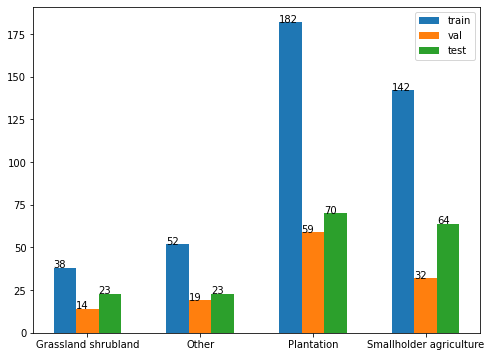

In [ ]:
# Plot distribution of data
train_df_class = train_df.groupby(['merged_label']).size().to_frame('train').reset_index()
val_df_class = val_df.groupby(['merged_label']).size().to_frame('val').reset_index()
test_df_class = test_df.groupby(['merged_label']).size().to_frame('test').reset_index()

plt.figure(figsize=(8, 6))
x_axis = np.arange(len(train_df_class['merged_label']))
index = [[train_df_class,'train',-0.2],[val_df_class,'val',0],[test_df_class,'test',0.2]]
for i in index:
  df = i[0]
  bars = plt.bar(x_axis + i[2], df[i[1]] , width=0.2, label=i[1])
  for bar in bars:
      yval = bar.get_height()
      plt.text(bar.get_x(), yval + .005, yval)
plt.xticks(x_axis,train_df_class['merged_label'])
plt.legend()
plt.show()

## Membuat Class Dataset
Class yang dibuat digunakan untuk memproses semua data yang tersedia dari train, validation, dan test. Masing-masing label, segmentasi daerah penggundulan, dan gambar citra satelit akan dimuat menjadi satu


In [ ]:
class ForestDataset(Dataset):
    """Forest dataset."""

    def __init__(self, csv_file_to_df, root_dir='ForestNetDataset', transform=None):
        self.csv = csv_file_to_df
        self.root_dir = root_dir
        self.transform = transform
        self.label_to_int = {'Grassland shrubland':1, 'Other':2, 'Plantation':3, 'Smallholder agriculture':4}

    def __len__(self):
        return len(self.csv)
    
    def poly_from_utm(self, polygon):
        poly_pts = []

        poly = unary_union(polygon)
        for i in np.array(poly.exterior.coords):

            poly_pts.append(tuple(i))

        new_poly = Polygon(poly_pts)
        return new_poly

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        label = self.csv.iloc[idx, 0]
        merged_label = self.csv.iloc[idx, 1]
        lat = self.csv.iloc[idx, 2]
        long = self.csv.iloc[idx, 3]
        year = self.csv.iloc[idx, 4]
        folder = self.csv.iloc[idx, 5]
        
        ## load the image
        image = io.imread(f'{self.root_dir}/{folder}/images/visible/composite.png')
          
        ## Get the segmentation map
        with open(f'{self.root_dir}/{folder}/forest_loss_region.pkl', 'rb') as f:
            data = pickle.load(f)
      
        nx, ny = 332, 332
        xy_array = np.empty((0,2))
        if data.geom_type == 'Polygon':
            data = [data]
        elif data.geom_type == 'Multipolygon':
            data = list(data)
              
        poly_shp = []
        for poly_verts in data:
            poly_shp.append(self.poly_from_utm(poly_verts))

        mask = rasterize(shapes=poly_shp, out_shape=(332,332))
        seg = np.array(mask)
          
        image = torch.from_numpy(image).type(torch.float)
        image = image.permute(2, 0, 1)
        seg = torch.from_numpy(seg).type(torch.uint8)

        merged_label = self.label_to_int[merged_label]

        image = image[:, 86:246, 86:246]
        seg = seg[86:246, 86:246]
        return image, seg, merged_label
 

In [ ]:
# Load Dataset
train_dataset = ForestDataset( csv_file_to_df=train_df)
val_dataset = ForestDataset( csv_file_to_df=val_df)
test_dataset = ForestDataset( csv_file_to_df=test_df)

## Membuat model segmentasi
Model segmentasi yang dibuat menggunakan arsitektur UNet.

In [ ]:
# Build Model
class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.1),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.1)
        )

    def forward(self, x):
        return self.double_conv(x)


class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)


class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)
    
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=True):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 8)
        self.down1 = Down(8, 16)
        self.down2 = Down(16, 32)
        self.down3 = Down(32, 64)
        factor = 2 if bilinear else 1
        self.down4 = Down(64, 128 // factor)
        self.up1 = Up(128, 64 // factor, bilinear)
        self.up2 = Up(64, 32 // factor, bilinear)
        self.up3 = Up(32, 16 // factor, bilinear)
        self.up4 = Up(16, 8, bilinear)
        self.outc = OutConv(8, n_classes)

        self.flatten = nn.Flatten()
        self.lin1 = nn.Linear(6400, 512)
        self.lin2 = nn.Linear(512, 256)
        self.lin3 = nn.Linear(256, 4)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        
        pred = self.flatten(x5)
        pred = F.relu(self.lin1(pred))
        pred = F.relu(self.lin2(pred))
        pred = self.lin3(pred)
        return logits, pred

In [ ]:
# Initialization several arguments for training
BATCH_SIZE = 64
DEVICE = 'cuda'
LR = 0.001
EPOCH = 100

# Define paramters for Focal Loss
ALPHA = 0.8
GAMMA = 2

In [ ]:
## Reweighting optimisation
def get_train_weights(train_dataset):
    train_weights = [0, 0, 0, 0, 0]
    for i in range(len(train_dataset)):
        image, seg, labels = train_dataset[i]
        segs = torch.mul(seg, labels)
        indx, counts = torch.unique(segs, return_counts=True)
        for ind, count in zip(indx, counts):
            train_weights[ind] += count
            
    weights = 1 / np.asarray(train_weights[1:])
    weights = weights / np.max(weights)
    return weights

def get_train_weights_binary(train_dataset):
    train_weights_bin_seg = [0, 0]
    for i in range(len(train_dataset)):
        image, seg, labels = train_dataset[i]
        indx, counts = torch.unique(seg, return_counts=True)
        for ind, count in zip(indx, counts):
            train_weights_bin_seg[ind] += count
    train_weights_bin_seg = train_weights_bin_seg[0]/train_weights_bin_seg[1]
    return train_weights_bin_seg

In [ ]:
# Reweighting for optimization
train_weights = get_train_weights(train_dataset)
train_weights_bin_seg = get_train_weights_binary(train_dataset)

# Create DataLoader from Dataset    
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE,shuffle=True)
valloader = torch.utils.data.DataLoader(val_dataset, batch_size=BATCH_SIZE,shuffle=False)
testloader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE,shuffle=False)

#Define model U-Net
net = UNet(3,1)
net = net.to(DEVICE)

# Define weight, loss, and log file. Make sure that the directory for storing log file is exist
train_weights = torch.from_numpy(train_weights).type(torch.float).to(DEVICE)
criterion_class = nn.CrossEntropyLoss(weight=train_weights)
criterion_seg = nn.BCEWithLogitsLoss(pos_weight=train_weights_bin_seg.to(DEVICE))
optimizer = optim.AdamW(net.parameters(), lr=LR)
log_file = open(f'Mini Workshop/training.txt','w')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:50: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.


In [ ]:
## Accuracy functions
def get_acc_seg(outputs, segs):
    outputs = torch.max(outputs, dim=1)[1]
    acc = (outputs==segs)
    acc = acc.view(-1)
    return acc.sum()/len(acc)

def get_acc_seg_weighted(outputs, segs):
    outputs = torch.max(outputs, dim=1)[1]
    acc = []
    for i in range(5):
        acc_temp = (outputs==segs)
        acc_temp = acc_temp.view(-1)
        acc.append(acc_temp.sum()/len(acc_temp))
    return torch.mean(torch.stack(acc))

def get_acc_nzero(outputs, segs):
    mask = ~segs.eq(0)
    outputs = torch.max(outputs, dim=1)[1]
    acc = torch.masked_select((outputs==segs), mask)
    return acc.sum()/len(acc)

def get_acc_class(outputs, labels):
    outputs = torch.max(outputs, dim=1)[1]
    acc = (outputs==labels)
    return acc.sum()/len(acc)

def get_acc_binseg(outputs, segs):
    outputs = F.sigmoid(outputs)
    outputs[outputs>=0.5] = 1
    outputs[outputs<0.5] = 0
    acc = (outputs==segs)
    acc_1 = acc[segs==1].view(-1)
    acc_0 = acc[segs==0].view(-1)
    acc_1 = acc_1.sum()/len(acc_1)
    acc_0 = acc_0.sum()/len(acc_0)
    return acc_1, acc_0, (acc_1+acc_0)/2

## Training

In [ ]:
# Train the model
for epoch in range(EPOCH):
    running_loss = 0.0
    running_acc_seg = 0.0
    running_acc_class = 0.0
    net.train()
    for i, data in enumerate(trainloader):
      # get the inputs
      inputs, segs, labels = data
      inputs = inputs.to(DEVICE)
      segs = segs.to(DEVICE)
      labels = labels.to(DEVICE)-1

      # zero the parameter gradients
      optimizer.zero_grad()

      # forward + backward + optimize
      outputs, out_class = net(inputs)

      # focal loss for segmentation and label
      bce_loss_seg = criterion_seg(outputs, torch.unsqueeze(segs.float(), dim=1))
      pt_seg = torch.exp(-bce_loss_seg)
      loss_seg = ALPHA * (1-pt_seg)**GAMMA * bce_loss_seg

      ce_loss_class = criterion_class(out_class, labels)
      pt_class = torch.exp(-ce_loss_class)
      loss_class = ALPHA * (1-pt_class)**GAMMA * ce_loss_class 

      loss = loss_class + loss_seg

      loss.backward()
      optimizer.step()

      m1, m0, m_avg = get_acc_binseg(outputs, torch.unsqueeze(segs.float(), dim=1))
      running_acc_seg += m_avg.item()
      running_acc_class += get_acc_class(out_class, labels).item()

      running_loss += loss.item()
            
    # print statistics
    summary_str = f'Train Epoch {epoch}\tLoss {running_loss/len(trainloader)}\tAccuracy Seg {running_acc_seg/len(trainloader)}\tAccuracy Class {running_acc_class/len(trainloader)}'
    print(summary_str)
    log_file.write(summary_str+'\n')

    running_loss = 0.0
    running_acc_seg = 0.0
    running_acc_class = 0.0
    net.eval()
    for i, data in enumerate(valloader):
      # get the inputs
      inputs, segs, labels = data
      inputs = inputs.to(DEVICE)
      segs = segs.to(DEVICE)
      labels = labels.to(DEVICE)-1

      # forward
      outputs, out_class = net(inputs)

      bce_loss_seg = criterion_seg(outputs, torch.unsqueeze(segs.float(), dim=1))
      pt_seg = torch.exp(-bce_loss_seg)
      loss_seg = ALPHA * (1-pt_seg)**GAMMA * bce_loss_seg

      ce_loss_class = criterion_class(out_class, labels)
      pt_class = torch.exp(-ce_loss_class)
      loss_class = ALPHA * (1-pt_class)**GAMMA * ce_loss_class 

      loss = loss_class + loss_seg

      m1, m0, m_avg = get_acc_binseg(outputs, torch.unsqueeze(segs.float(), dim=1))
      running_acc_seg += m_avg.item()
      running_acc_class += get_acc_class(out_class, labels).item()

      running_loss += loss.item()

      # print statistics
    summary_str = f'Val Epoch {epoch}\tLoss {running_loss/len(valloader)}\tAccuracy Seg {running_acc_seg/len(valloader)}\tAccuracy Class {running_acc_class/len(valloader)}'
    print(summary_str)
    log_file.write(summary_str+'\n')

    if (epoch%10 == 0) and epoch!=0:
        torch.save({
            'epoch': epoch,
            'model_state_dict': net.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            }, f'Mini Workshop/model_{epoch}.pt')

print('Finished Training')
log_file.close()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:50: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


Train Epoch 0	Loss 1.047576027257102	Accuracy Seg 0.5125244387558529	Accuracy Class 0.20148809573480062
Val Epoch 0	Loss 1.1795867681503296	Accuracy Seg 0.4992764890193939	Accuracy Class 0.3062500059604645
Train Epoch 1	Loss 0.9006038904190063	Accuracy Seg 0.5510499562535968	Accuracy Class 0.21458333358168602
Val Epoch 1	Loss 1.1371207535266876	Accuracy Seg 0.4985625147819519	Accuracy Class 0.2723958417773247
Train Epoch 2	Loss 0.8389655947685242	Accuracy Seg 0.5800766093390328	Accuracy Class 0.3302083356039865
Val Epoch 2	Loss 1.1494354605674744	Accuracy Seg 0.602317750453949	Accuracy Class 0.28072917461395264
Train Epoch 3	Loss 0.7702189939362662	Accuracy Seg 0.5958370651517596	Accuracy Class 0.28452381065913607
Val Epoch 3	Loss 0.9034333825111389	Accuracy Seg 0.5983902513980865	Accuracy Class 0.3218750059604645
Train Epoch 4	Loss 0.7297137039048331	Accuracy Seg 0.5963069796562195	Accuracy Class 0.33333333475249155
Val Epoch 4	Loss 1.1863924860954285	Accuracy Seg 0.5737208127975464	A

## Testing

In [ ]:
img_idx = 1

for i, data in enumerate(testloader):
    inputs, segs, labels = data
    inputs = inputs.to(DEVICE)
    segs = segs.to(DEVICE)
    labels = labels.to(DEVICE)-1
    segs_labelled = torch.mul(segs, labels.view(-1,1,1))
    
    outputs, out_class = net(inputs)

    inputs_rot = torch.rot90(inputs, k=1, dims=[-2,-1])
    segs_rot = torch.rot90(segs, k=1, dims=[-2,-1])
    
    outputs_rot, out_class_rot = net(inputs_rot)
        
outputs = torch.sigmoid(outputs)
outputs[outputs>=0.5] = 1
outputs[outputs<0.5] = 0
outputs = torch.squeeze(outputs, dim=1).detach().cpu().numpy()

outputs_rot = torch.sigmoid(outputs_rot)
outputs_rot[outputs_rot>=0.5] = 1
outputs_rot[outputs_rot<0.5] = 0
outputs_rot = torch.squeeze(outputs_rot, dim=1).detach().cpu().numpy()

inputs = inputs.detach().cpu().numpy()
inputs_rot = inputs_rot.detach().cpu().numpy()
out_class = out_class.detach().cpu().numpy()
out_class_rot = out_class_rot.detach().cpu().numpy()
segs = segs.detach().cpu().numpy()
segs_rot = segs_rot.detach().cpu().numpy()
segs_labelled = segs_labelled.detach().cpu().numpy()
labels = labels.detach().cpu().numpy()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:50: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.


### Plot result

Predicted label 0 - True label 0
Predicted label 0 - True label 0


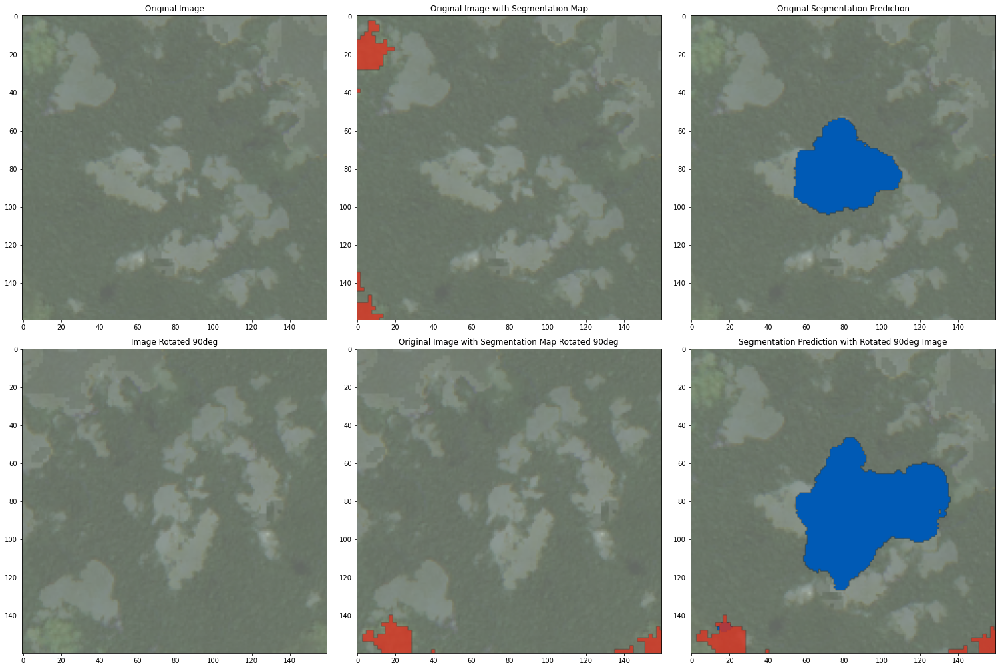

Predicted label 3 - True label 3
Predicted label 3 - True label 3


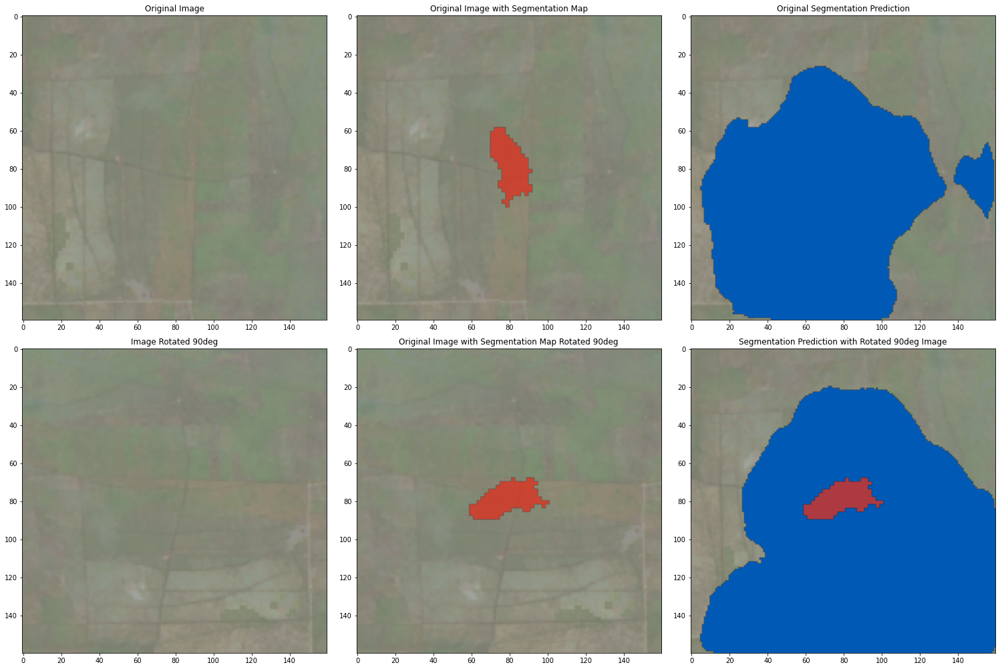

Predicted label 1 - True label 1
Predicted label 0 - True label 1


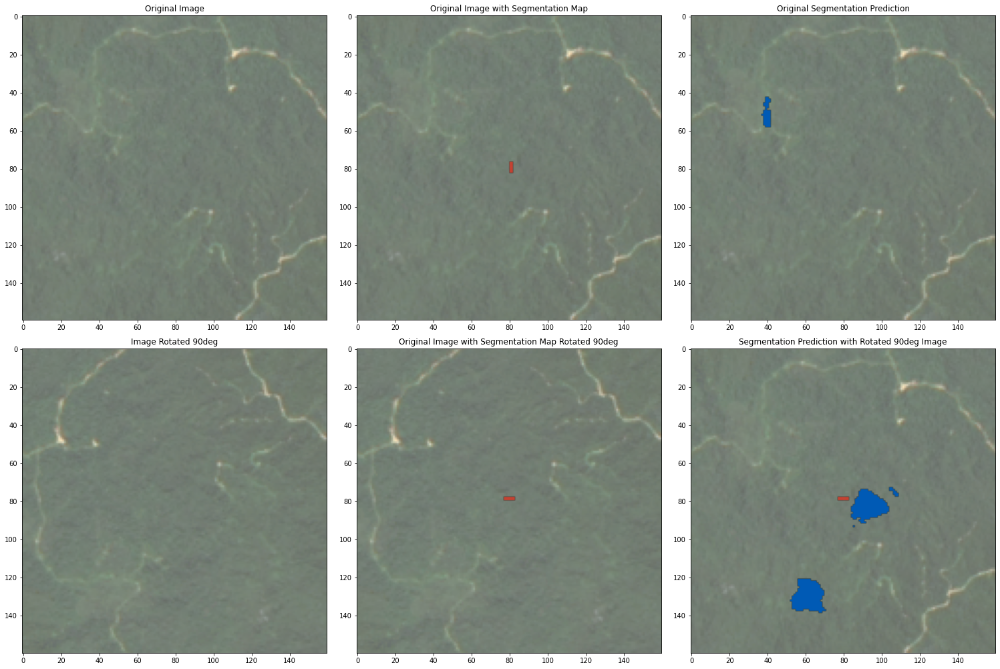

Predicted label 0 - True label 1
Predicted label 1 - True label 1


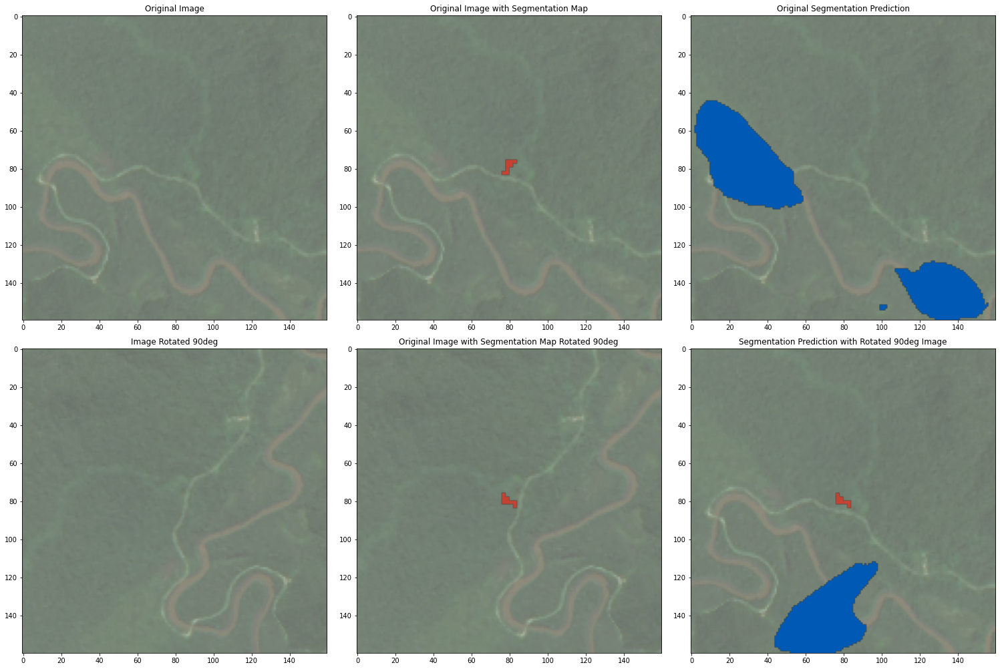

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted label 2 - True label 2
Predicted label 2 - True label 2


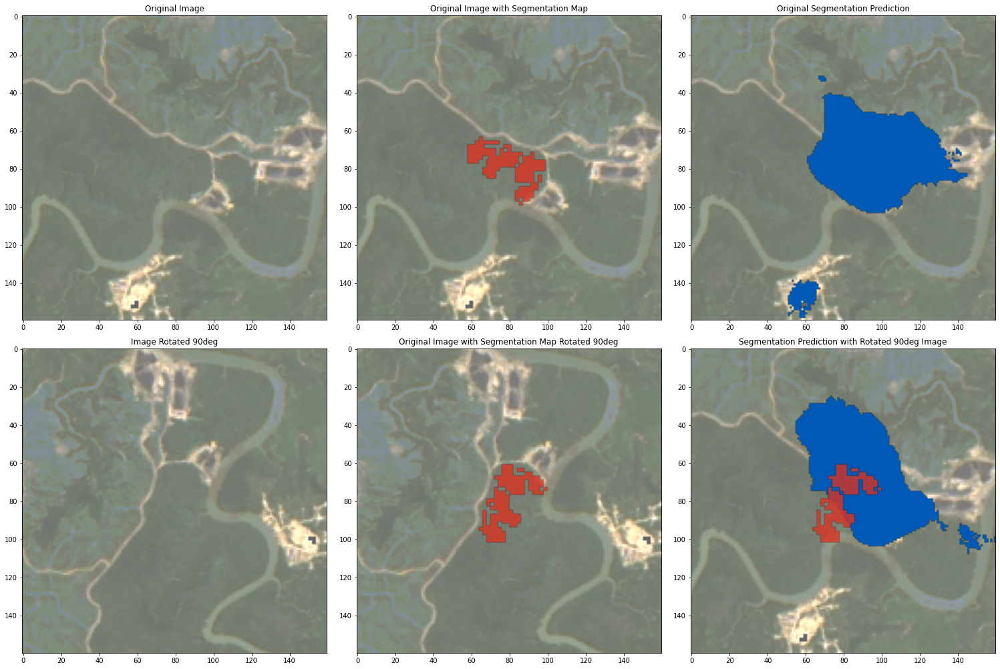

Predicted label 3 - True label 3
Predicted label 0 - True label 3


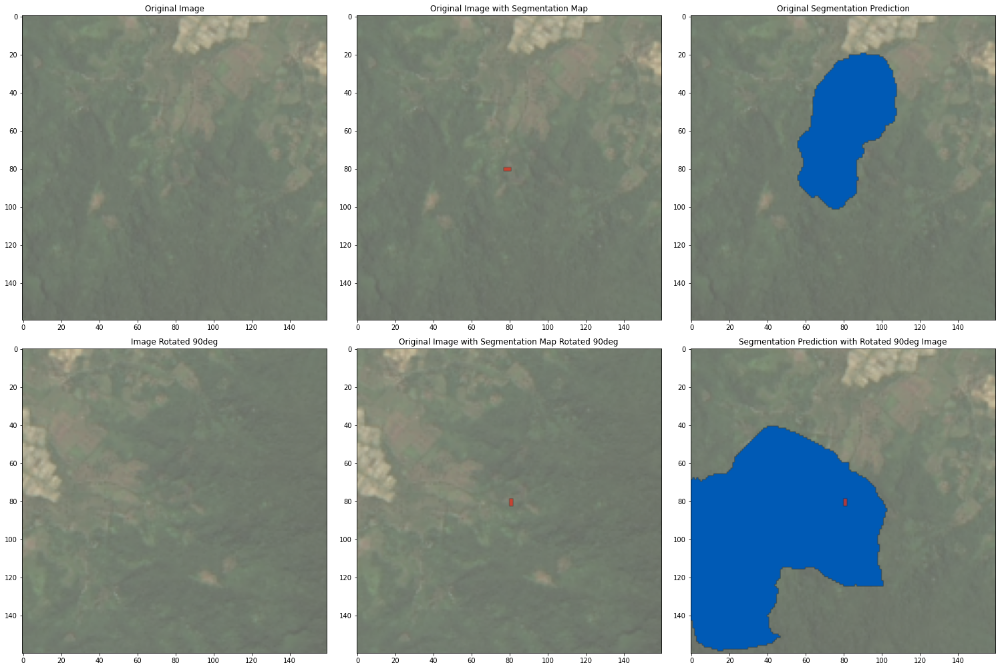

Predicted label 0 - True label 3
Predicted label 0 - True label 3


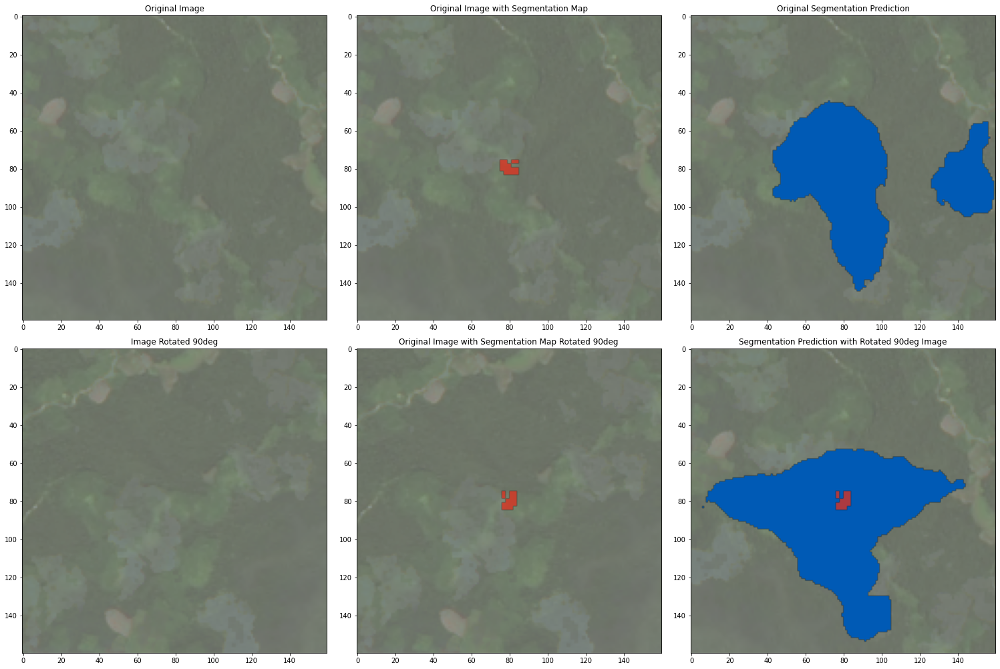

Predicted label 0 - True label 3
Predicted label 3 - True label 3


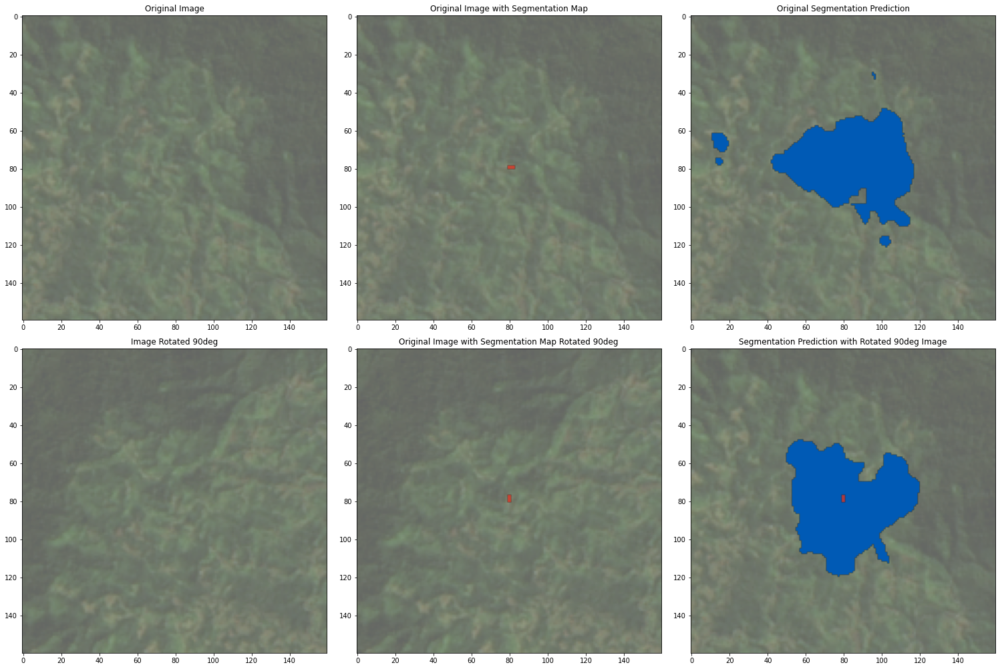

Predicted label 0 - True label 0
Predicted label 2 - True label 0


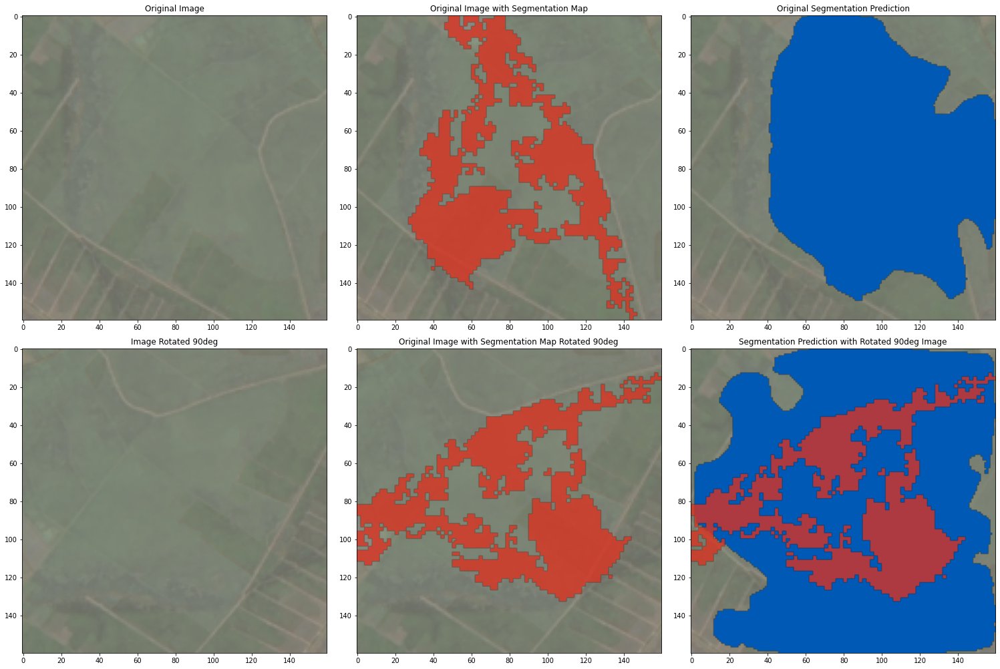

Predicted label 1 - True label 1
Predicted label 1 - True label 1


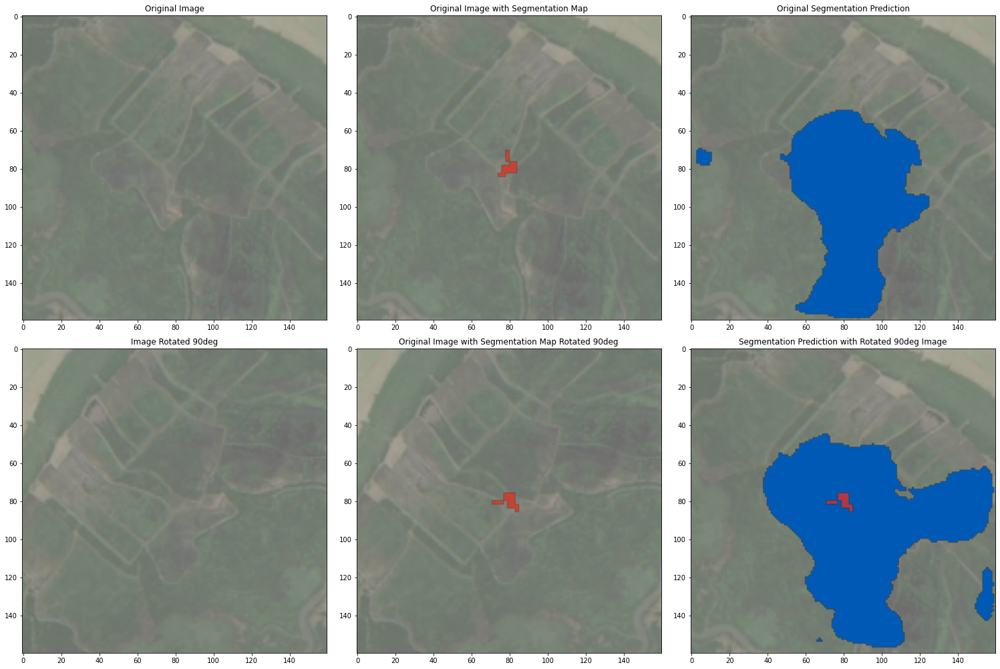

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted label 1 - True label 2
Predicted label 1 - True label 2


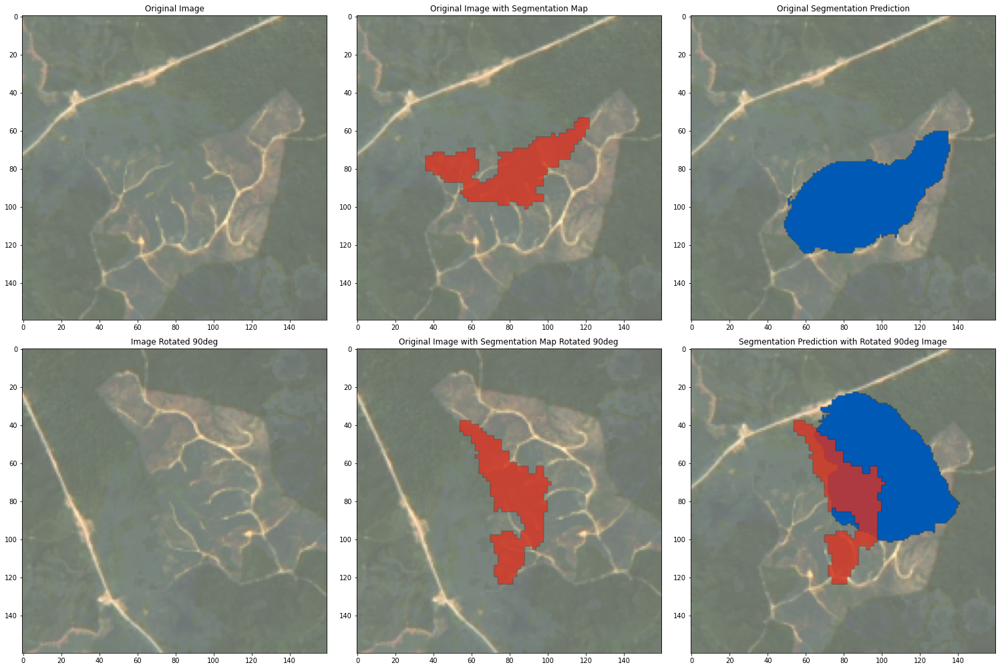

Predicted label 0 - True label 3
Predicted label 3 - True label 3


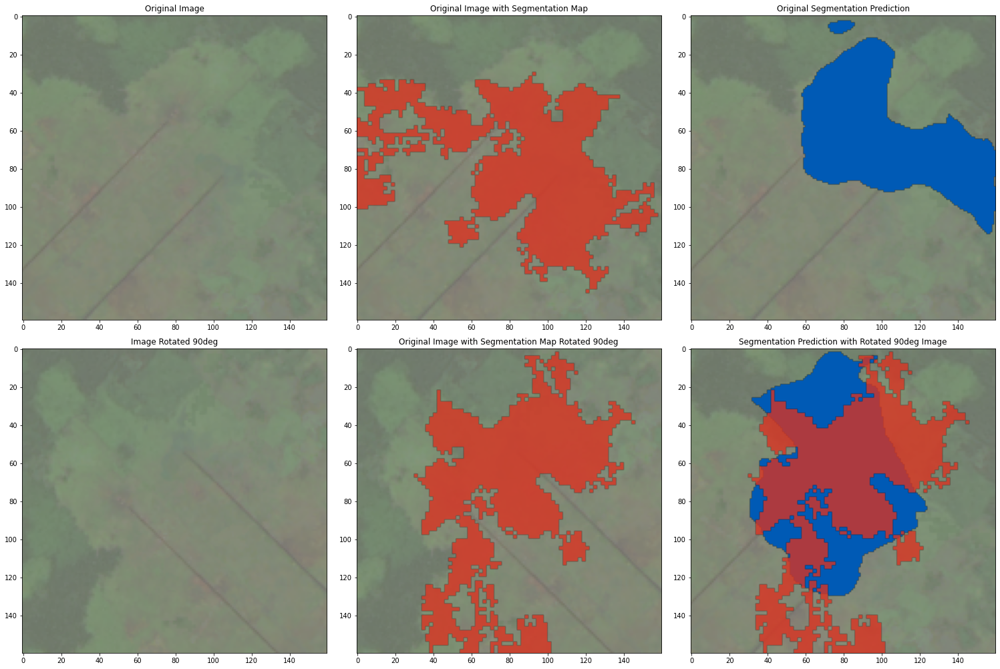

Predicted label 1 - True label 0
Predicted label 0 - True label 0


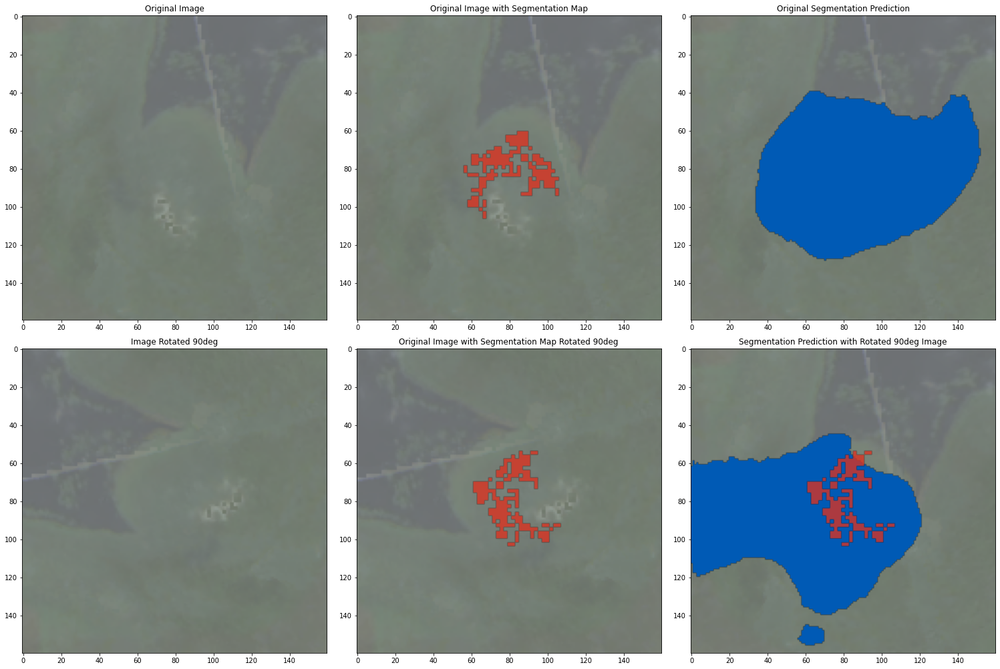

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predicted label 2 - True label 1
Predicted label 1 - True label 1


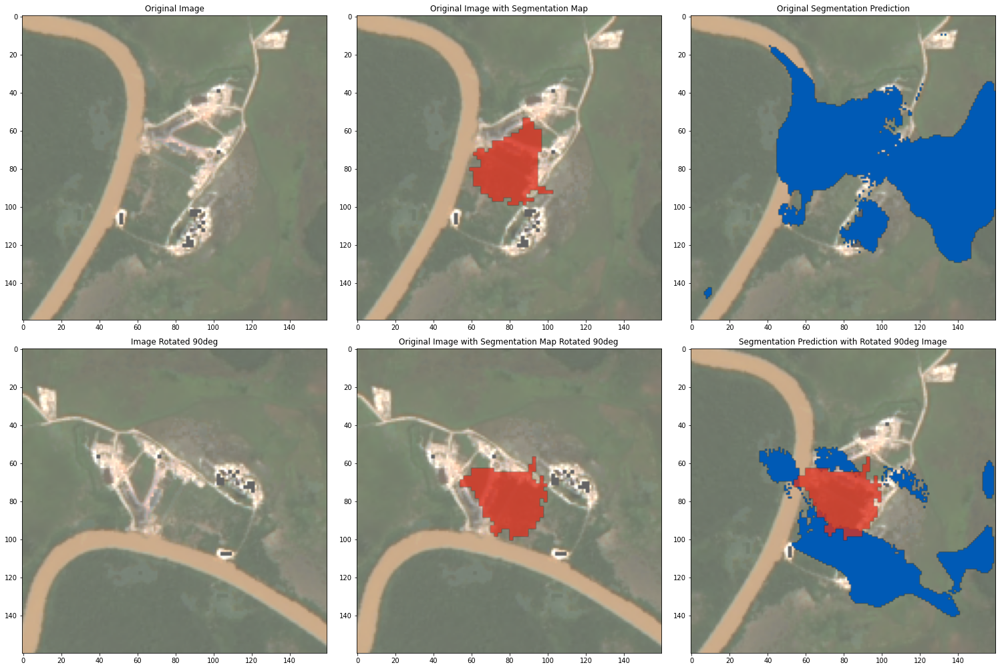

Predicted label 3 - True label 3
Predicted label 0 - True label 3


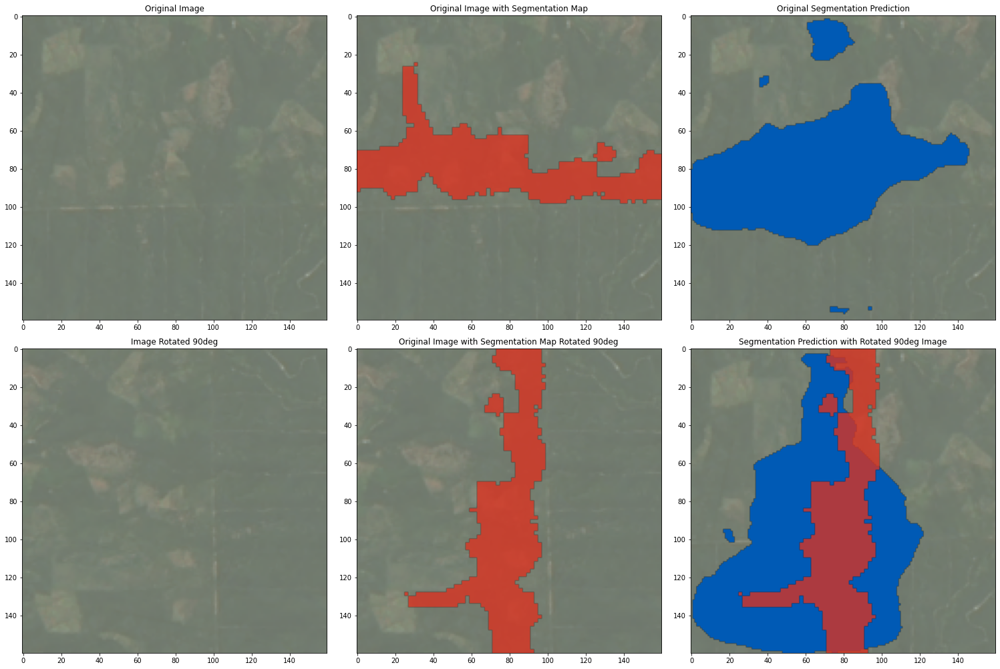

Predicted label 3 - True label 3
Predicted label 3 - True label 3


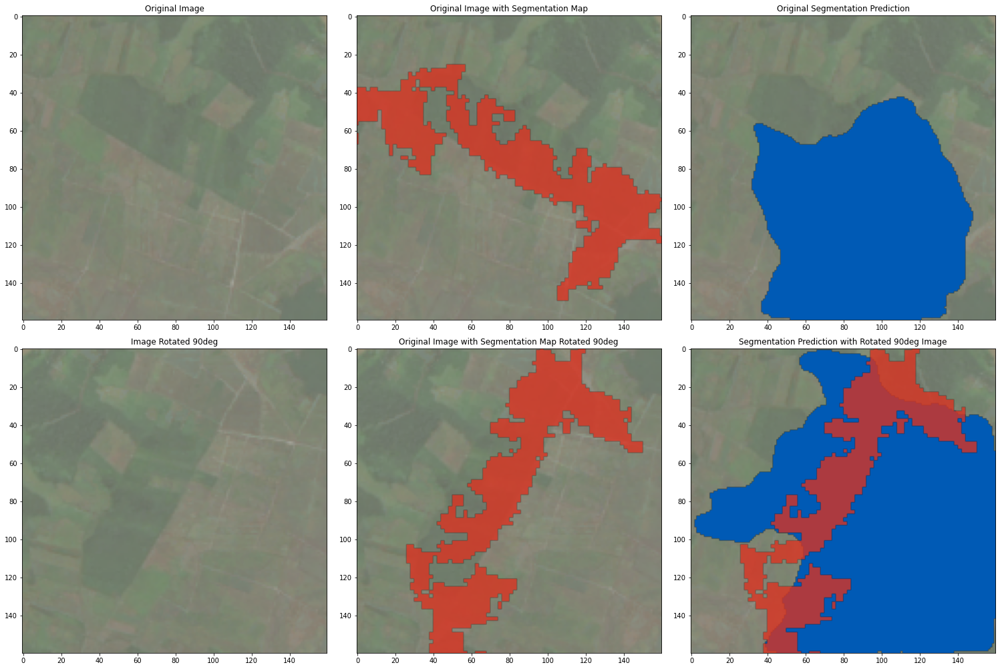

Predicted label 1 - True label 2
Predicted label 3 - True label 2


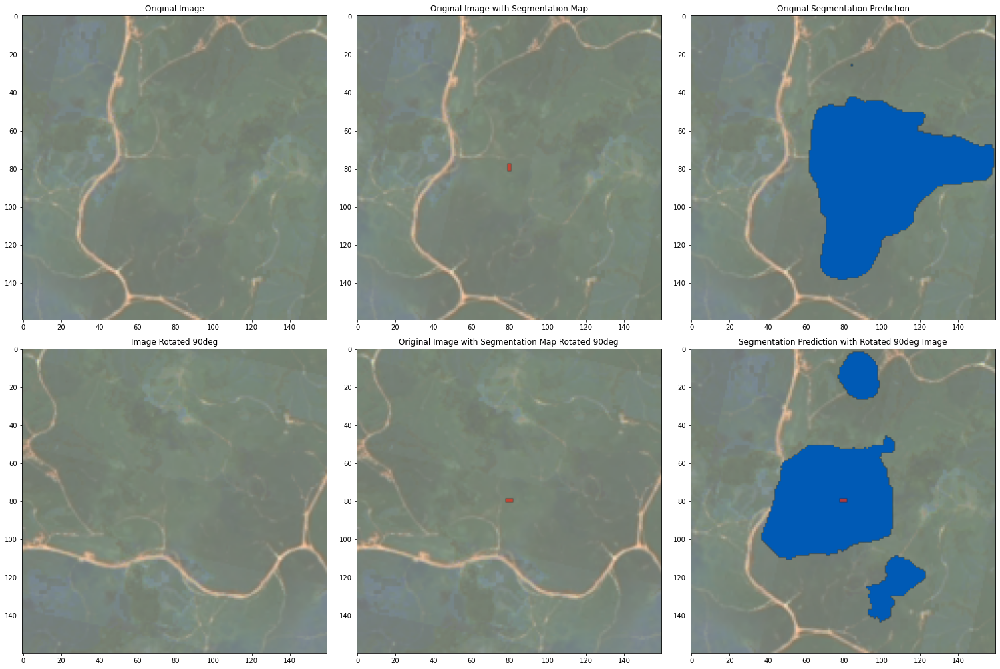

Predicted label 3 - True label 2
Predicted label 3 - True label 2


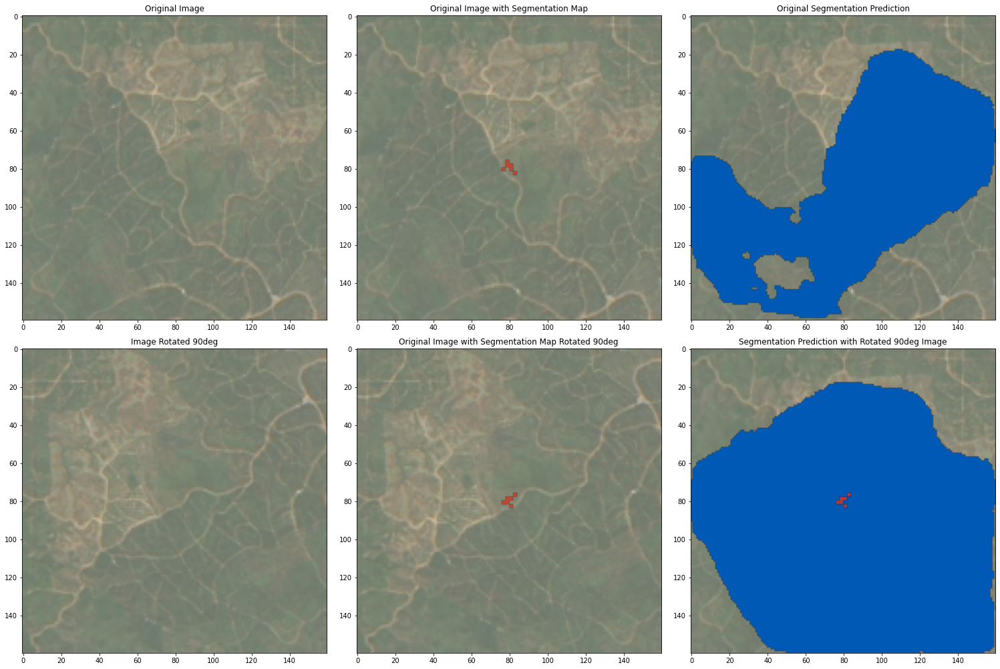

Predicted label 0 - True label 1
Predicted label 3 - True label 1


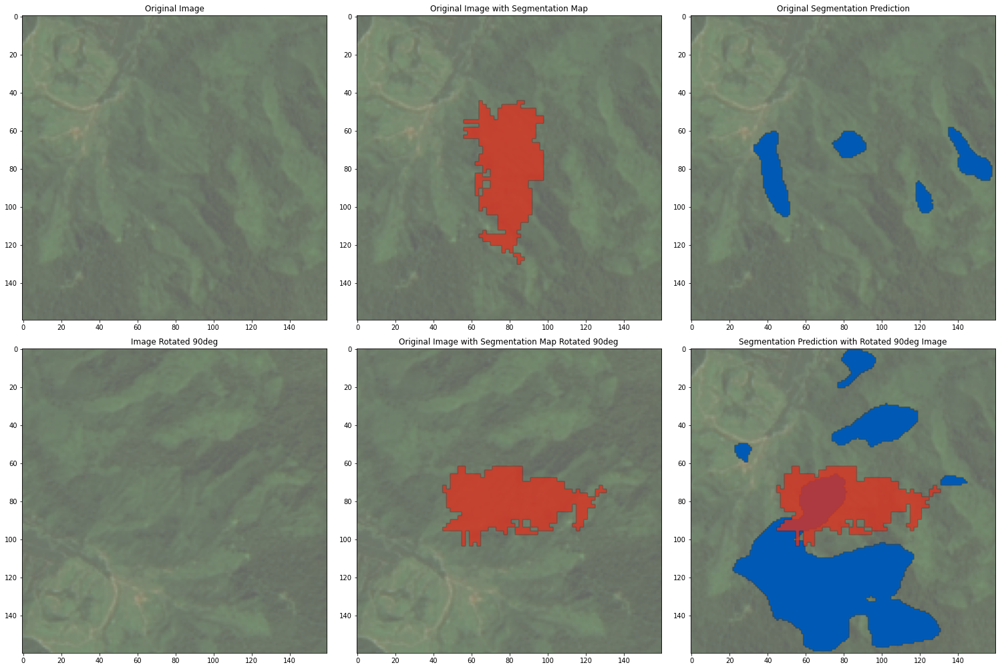

Predicted label 3 - True label 2
Predicted label 3 - True label 2


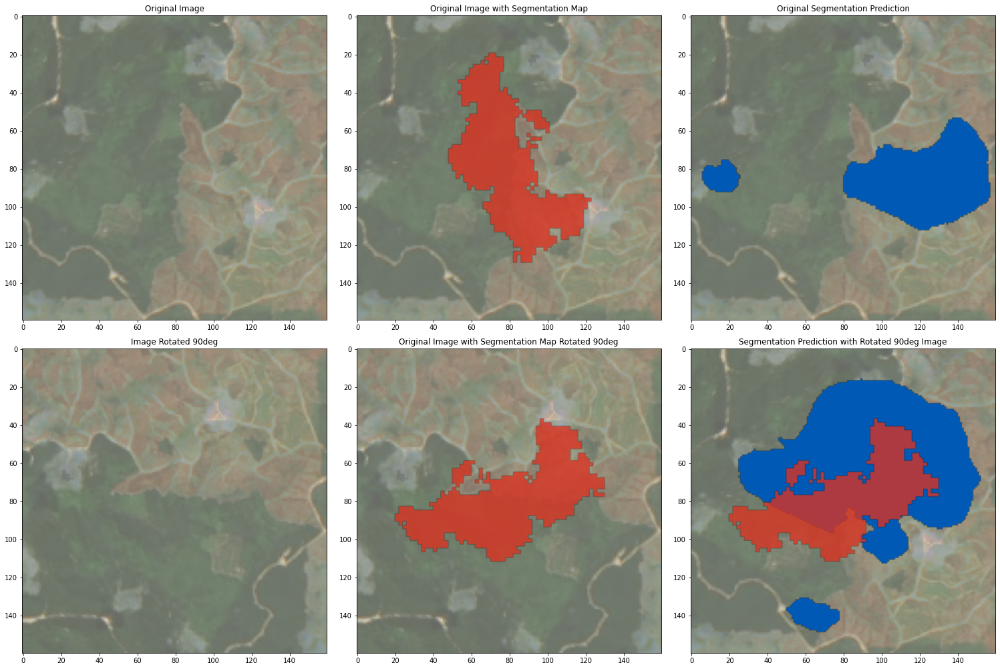

In [ ]:
for i in range(20):
    img_idx = i
    print(f'Predicted label {np.argmax(out_class[img_idx])} - True label {labels[img_idx]}')
    print(f'Predicted label {np.argmax(out_class_rot[img_idx])} - True label {labels[img_idx]}')
    plt.figure(figsize=(21,14))

    plt.subplot(2,3,1)
    plt.imshow(np.transpose(inputs[img_idx].astype(int)+100, (1,2,0)))
    plt.title(f'Original Image')

    plt.subplot(2,3,2)
    plt.imshow(np.transpose(inputs[img_idx].astype(int)+100, (1,2,0)))
    segs_plot = np.repeat(np.expand_dims(segs[img_idx], axis=2), 4, axis=2)
    segs_plot[:,:,0][segs_plot[:,:,0]==1] = 220
    segs_plot[:,:,1][segs_plot[:,:,1]==1] = 50
    segs_plot[:,:,2][segs_plot[:,:,2]==1] = 32
    segs_plot[:,:,3][segs_plot[:,:,3]==1] = 200
    plt.imshow(segs_plot)
    plt.title(f'Original Image with Segmentation Map')

    plt.subplot(2,3,3)
    plt.imshow(np.transpose(inputs[img_idx].astype(int)+100, (1,2,0)))
    outputs_plot = np.repeat(np.expand_dims(outputs[img_idx], axis=2), 4, axis=2)
    outputs_plot = outputs_plot.astype(int)
    outputs_plot[:,:,0][outputs_plot[:,:,0]==1] = 0
    outputs_plot[:,:,1][outputs_plot[:,:,1]==1] = 90
    outputs_plot[:,:,2][outputs_plot[:,:,2]==1] = 181
    outputs_plot[:,:,3][outputs_plot[:,:,3]==1] = 255
    im = plt.imshow(outputs_plot)
    # plt.imshow(edge_sobel_segs)
    plt.title(f'Original Segmentation Prediction')

    plt.subplot(2,3,4)
    plt.imshow(np.transpose(inputs_rot[img_idx].astype(int)+100, (1,2,0)))
    plt.title(f'Image Rotated 90deg')

    plt.subplot(2,3,5)
    plt.imshow(np.transpose(inputs_rot[img_idx].astype(int)+100, (1,2,0)))
    segs_rot_plot = np.repeat(np.expand_dims(segs_rot[img_idx], axis=2), 4, axis=2)
    segs_rot_plot[:,:,0][segs_rot_plot[:,:,0]==1] = 220
    segs_rot_plot[:,:,1][segs_rot_plot[:,:,1]==1] = 50
    segs_rot_plot[:,:,2][segs_rot_plot[:,:,2]==1] = 32
    segs_rot_plot[:,:,3][segs_rot_plot[:,:,3]==1] = 200
    plt.imshow(segs_rot_plot)
    plt.title(f'Original Image with Segmentation Map Rotated 90deg')

    plt.subplot(2,3,6)
    plt.imshow(np.transpose(inputs[img_idx].astype(int)+100, (1,2,0)))
    outputs_rot_plot = np.repeat(np.expand_dims(outputs_rot[img_idx], axis=2), 4, axis=2)
    outputs_rot_plot = outputs_rot_plot.astype(int)
    outputs_rot_plot[:,:,0][outputs_rot_plot[:,:,0]==1] = 0
    outputs_rot_plot[:,:,1][outputs_rot_plot[:,:,1]==1] = 90
    outputs_rot_plot[:,:,2][outputs_rot_plot[:,:,2]==1] = 181
    outputs_rot_plot[:,:,3][outputs_rot_plot[:,:,3]==1] = 255
    im = plt.imshow(outputs_rot_plot)
    plt.imshow(segs_rot_plot)

    plt.title(f'Segmentation Prediction with Rotated 90deg Image')
    plt.tight_layout()
    plt.show()

## Check GPU Usage

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print()

#Additional Info when using cuda
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')
    print('Cached:   ', round(torch.cuda.memory_reserved(0)/1024**3,1), 'GB')

Using device: cuda

Tesla T4
Memory Usage:
Allocated: 1.0 GB
Cached:    5.6 GB
